In [64]:
import CairoMakie as CM

In [1]:
using Comrade

In [2]:
using Plots

In [3]:
using Pyehtim

In [7]:
pwd()

"/home/ga2024eht32/iau-ga2024-eht-hackathon"

In [190]:
obseht = ehtim.obsdata.load_uvfits(joinpath("data", "generated_1.uvf"))

Python: <ehtim.obsdata.Obsdata object at 0x7f0ae2745150>

In [191]:
?obseht

search: obseht



Python object of type `Obsdata`.

```text
A polarimetric VLBI observation of visibility amplitudes and phases (in Jy).

Attributes:
    source (str): The source name
    ra (float): The source Right Ascension in fractional hours
    dec (float): The source declination in fractional degrees
    mjd (int): The integer MJD of the observation
    tstart (float): The start time of the observation in hours
    tstop (float): The end time of the observation in hours
    rf (float): The observation frequency in Hz
    bw (float): The observation bandwidth in Hz
    timetype (str): How to interpret tstart and tstop; either 'GMST' or 'UTC'
    polrep (str): polarization representation, either 'stokes' or 'circ'

    tarr (numpy.recarray): The array of telescope data with datatype DTARR
    tkey (dict): A dictionary of rows in the tarr for each site name
    data (numpy.recarray): the basic data with datatype DTPOL_STOKES or DTPOL_CIRC
    scantable (numpy.recarray): The array of scan information

    ampcal (bool): True if amplitudes calibrated
    phasecal (bool): True if phases calibrated
    opacitycal (bool): True if time-dependent opacities correctly accounted for in sigmas
    frcal (bool): True if feed rotation calibrated out of visibilities
    dcal (bool): True if D terms calibrated out of visibilities

    amp (numpy.recarray): An array of (averaged) visibility amplitudes
    bispec (numpy.recarray): An array of (averaged) bispectra
    cphase (numpy.recarray): An array of (averaged) closure phases
    cphase_diag (numpy.recarray): An array of (averaged) diagonalized closure phases
    camp (numpy.recarray): An array of (averaged) closure amplitudes
    logcamp (numpy.recarray): An array of (averaged) log closure amplitudes
    logcamp_diag (numpy.recarray): An array of (averaged) diagonalized log closure amps
```


In [211]:
obs = Pyehtim.scan_average(obseht.flag_uvdist(uv_min=0.1e9)).add_fractional_noise(0.02)

[ Info: Before homogenizing we have 81 unique times
[ Info: After homogenizing we have 81 unique times


Python: <ehtim.obsdata.Obsdata object at 0x7f0aea5cb9d0>

In [212]:
vis    = extract_table(obs, Visibilities()) ## complex visibilites
amp    = extract_table(obs, VisibilityAmplitudes()) ## visibility amplitudes
cphase = extract_table(obs, ClosurePhases(; snrcut=3.0)) ## extract minimal set of closure phases
lcamp  = extract_table(obs, LogClosureAmplitudes(; snrcut=3.0)) ## extract minimal set of log-closure amplitudes

/shared/julia-depot/environments/v1.10/.CondaPkg/env/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/shared/julia-depot/environments/v1.10/.CondaPkg/env/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/shared/julia-depot/environments/v1.10/.CondaPkg/env/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/shared/julia-depot/environments/v1.10/.CondaPkg/env/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


EHTObservationTable{Comrade.EHTLogClosureAmplitudeDatum{:I}}
  source:      M87
  mjd:         57850
  bandwidth:   2.0e9
  sites:       [:ALMA, :APEX, :IRAM, :JCMT, :LMT, :SMA, :SMT]
  nsamples:    271

In [213]:
ac = arrayconfig(vis)

EHTArrayConfiguration:
  source:      M87
  mjd:         57850
  frequencies: [2.3e11]
  bandwidth:   2.0e9
  sites:       [:ALMA, :APEX, :IRAM, :JCMT, :LMT, :SMA, :SMT]
  nsamples:    617

In [214]:
typeof(ac)

Comrade.EHTArrayConfiguration{Comrade.EHTArrayBaselineDatum{Float64, Tuple{CirBasis, CirBasis}, Float64}, Float64, TypedTables.Table{@NamedTuple{sites::Symbol, X::Float64, Y::Float64, Z::Float64, SEFD1::Float64, SEFD2::Float64, fr_parallactic::Float64, fr_elevation::Float64, fr_offset::Float64}, 1, @NamedTuple{sites::Vector{Symbol}, X::Vector{Float64}, Y::Vector{Float64}, Z::Vector{Float64}, SEFD1::Vector{Float64}, SEFD2::Vector{Float64}, fr_parallactic::Vector{Float64}, fr_elevation::Vector{Float64}, fr_offset::Vector{Float64}}}, TypedTables.Table{@NamedTuple{start::Float64, stop::Float64}, 1, @NamedTuple{start::Vector{Float64}, stop::Vector{Float64}}}, StructArrays.StructVector{Comrade.EHTArrayBaselineDatum{Float64, Tuple{CirBasis, CirBasis}, Float64}, @NamedTuple{U::Vector{Float64}, V::Vector{Float64}, Ti::Vector{Float64}, Fr::Vector{Float64}, sites::Vector{Tuple{Symbol, Symbol}}, polbasis::Vector{Tuple{CirBasis, CirBasis}}, elevation::StructArrays.StructVector{Tuple{Float64, Float6

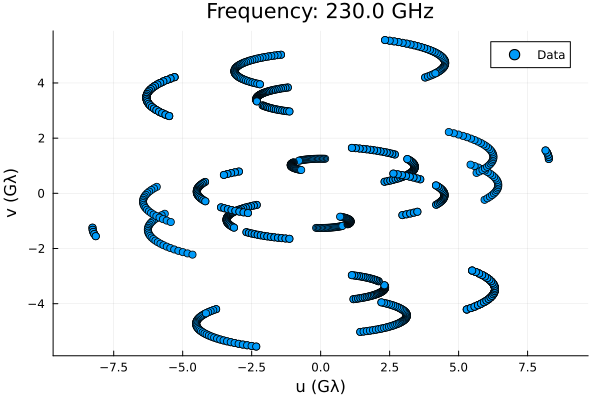

In [215]:
plot(ac)

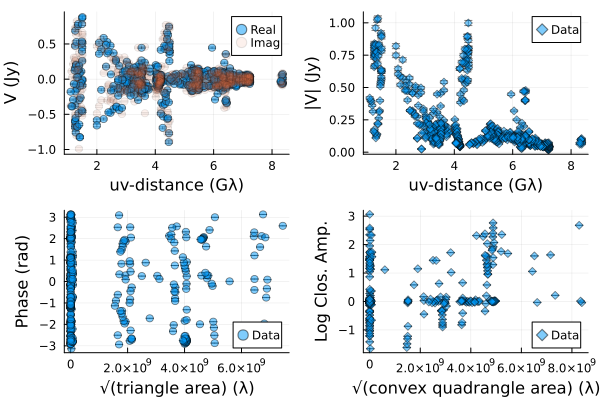

In [216]:
l = @layout [a b; c d]
pv = plot(vis);
pa = plot(amp);
pcp = plot(cphase);
plc = plot(lcamp);
plot(pv, pa, pcp, plc; layout=l)

In [217]:
v

LoadError: UndefVarError: `v` not defined

In [218]:
lcamp

EHTObservationTable{Comrade.EHTLogClosureAmplitudeDatum{:I}}
  source:      M87
  mjd:         57850
  bandwidth:   2.0e9
  sites:       [:ALMA, :APEX, :IRAM, :JCMT, :LMT, :SMA, :SMT]
  nsamples:    271

In [219]:
function model(θ, p)
    (;σG1, τG1, σG2, τG2, x2, y2, f2) = θ
    return stretched(Gaussian(), σG1, σG1*(1+τG1)) + f2*shifted(stretched(Gaussian(), σG2, σG2*(1+τG2)), x2, y2)
end

model (generic function with 1 method)

In [220]:
using Distributions, VLBIImagePriors

In [271]:
prior = (
  σG1 = Uniform(μas2rad(1.0), μas2rad(50.0)),
  τG1 = Uniform(0.0, 1.0),
  σG2 = Uniform(μas2rad(1.0), μas2rad(50.0)),
  τG2 = Uniform(0.0, 1.0),
  x2 = Uniform(μas2rad(-50.0), μas2rad(50.0)),
  y2 = Uniform(μas2rad(-50.0), μas2rad(50.0)),
  f2 = Uniform(1, 10),
)

skym = SkyModel(model, prior, imagepixels(μas2rad(200.0), μas2rad(200.0), 128, 128))

 SkyModel
  with map: model
   on grid: RectiGrid

In [272]:
using Distributions, VLBIImagePriors

In [273]:
post = VLBIPosterior(skym, lcamp, cphase)

VLBIPosterior
ObservedSkyModel
  with map: model
   on grid: FourierDualDomainIdealInstrumentModelData Products: Comrade.EHTLogClosureAmplitudeDatumComrade.EHTClosurePhaseDatum


In [274]:
# logdensityof(post, (sky = (σG = μas2rad(50.0), τG = 0.1,),))

In [275]:
using Optimization
using OptimizationBBO
xopt, sol = comrade_opt(post, BBO_adaptive_de_rand_1_bin_radiuslimited(); maxiters=50000);

In [276]:
xopt

(sky = (σG1 = 2.857127472549418e-11, τG1 = 0.0001000000000014148, σG2 = 7.745034540636647e-11, τG2 = 0.9998999999999999, x2 = 1.9904421926808004e-10, y2 = -2.42358359186657e-10, f2 = 7.917195952923262),)

In [277]:
S = simulate_observation(post, xopt; add_thermal_noise=false)[1]

EHTObservationTable{Comrade.EHTLogClosureAmplitudeDatum{:I}}
  source:      M87
  mjd:         57850
  bandwidth:   2.0e9
  sites:       [:ALMA, :APEX, :IRAM, :JCMT, :LMT, :SMA, :SMT]
  nsamples:    271

In [278]:
S.measurement

271-element Vector{Float64}:
  0.00016819593039341107
  0.0001626354582466849
  0.00015605271171037494
  0.00014819700860807528
  0.0001396793028614618
  2.9633467166778615e-5
  0.00013035974862257715
  1.5803743291086974
  1.4302150394301045
  3.382669340445954e-5
  0.00012033033205199883
  1.5887325370463163
  1.4455994817407873
  ⋮
  5.836317690049997e-5
 -0.00023613588274980224
 -0.00023106043344653675
 -0.0002271872282618992
 -0.0002004587316455364
 -0.00014234736395035696
 -5.2319371176889895e-5
  3.8412133926968295e-5
  0.00010041410460959188
  0.00013238176932162116
  0.0001440424764791448
  0.00014649487310469667

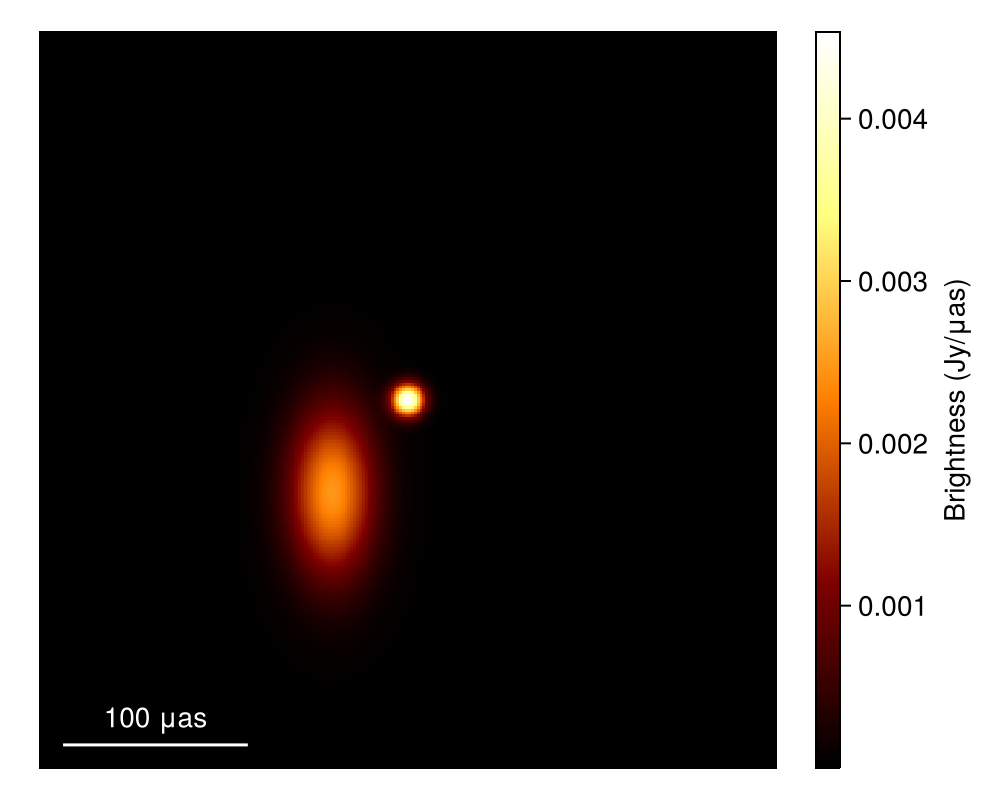

In [279]:
g = imagepixels(μas2rad(400.0), μas2rad(400.0), 256, 256)
fig = imageviz(intensitymap(skymodel(post, xopt), g), colormap=:afmhot, size=(500, 400))

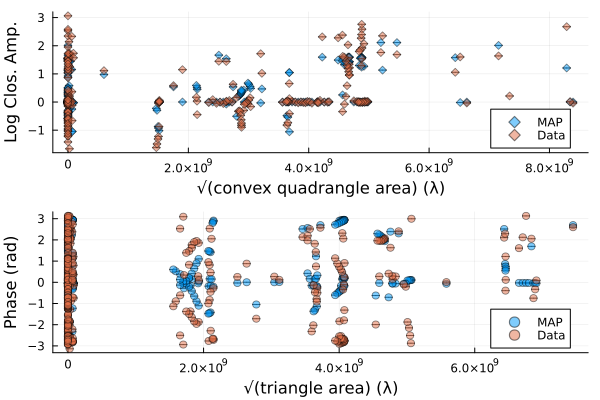

In [280]:
p1 = Plots.plot(simulate_observation(post, xopt; add_thermal_noise=false)[1], label="MAP")
Plots.plot!(p1, lcamp)
p2 = Plots.plot(simulate_observation(post, xopt; add_thermal_noise=false)[2], label="MAP")
Plots.plot!(p2, cphase)
Plots.plot(p1, p2, layout=(2,1))

In [295]:
using Pigeons
pt = pigeons(target=ascube(post), explorer=SliceSampler(), record=[traces, round_trip, log_sum_ratio], n_chains=16, n_rounds=5)

───────────────────────────────────────────────────────────────────────────────────────
  scans     restarts      Λ      log(Z₁/Z₀)   min(α)     mean(α)    min(αₑ)   mean(αₑ) 
────────── ────────── ────────── ────────── ────────── ────────── ────────── ──────────
        2          0          6  -1.68e+05          0        0.6          1          1 
        4          0       4.59  -1.51e+05          0      0.694          1          1 
        8          0       3.06  -1.41e+05   5.21e-30      0.796          1          1 
       16          0        5.3  -1.21e+05   3.99e-08      0.647          1          1 
       32          0       9.29   -1.2e+05     0.0689      0.381          1          1 
───────────────────────────────────────────────────────────────────────────────────────


PT(checkpoint = false, ...)

In [282]:
chain = sample_array(ascube(post), pt)

PosteriorSamples
  Samples size: (32,)
  sampler used: Pigeons
Mean
┌───────────────────────────────────────────────────────────────────────────────
│ sky                                                                          ⋯
│ @NamedTuple{σG1::Float64, τG1::Float64, σG2::Float64, τG2::Float64, x2::Floa ⋯
├───────────────────────────────────────────────────────────────────────────────
│ (σG1 = 2.85451e-11, τG1 = 0.00094698, σG2 = 7.74382e-11, τG2 = 0.999384, x2  ⋯
└───────────────────────────────────────────────────────────────────────────────
                                                                1 column omitted
Std. Dev.
┌───────────────────────────────────────────────────────────────────────────────
│ sky                                                                          ⋯
│ @NamedTuple{σG1::Float64, τG1::Float64, σG2::Float64, τG2::Float64, x2::Floa ⋯
├───────────────────────────────────────────────────────────────────────────────
│ (σG1 = 2.30682e-13, τG1 = 0.0

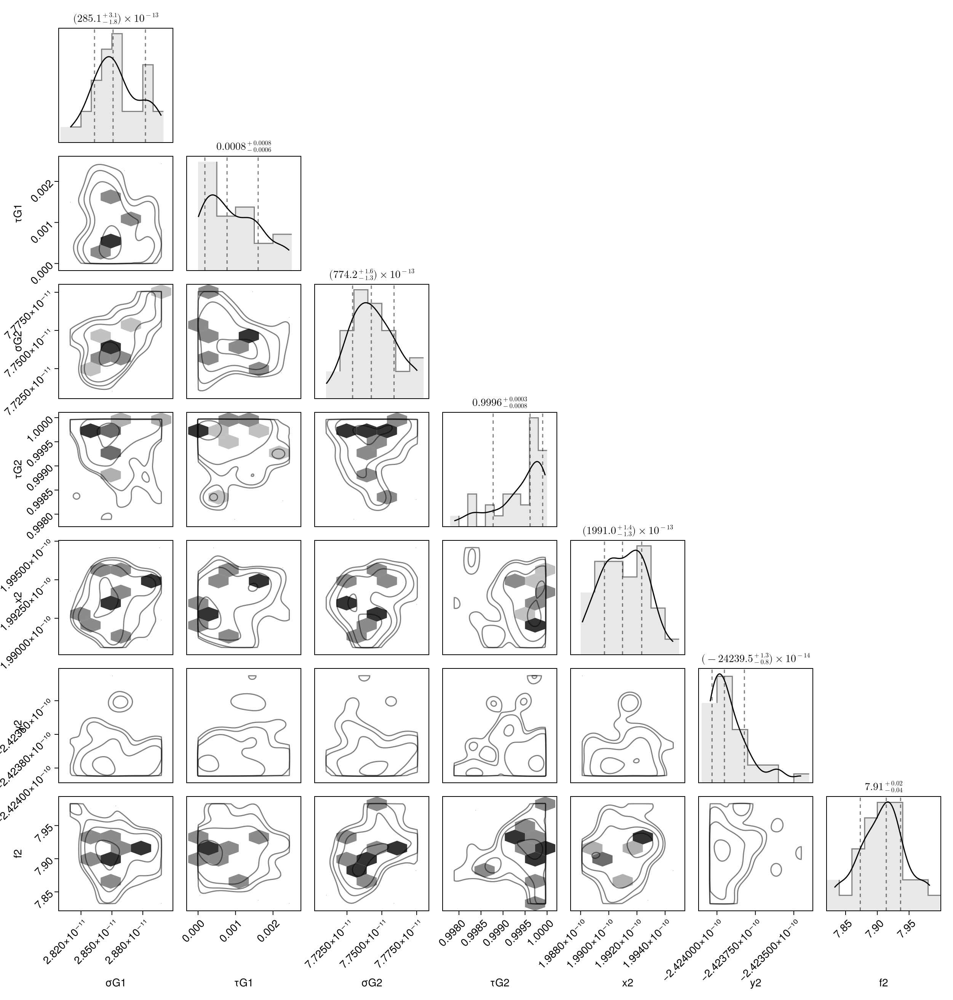

In [302]:
pairplot(chain.sky)

In [283]:
using MCMCChains

In [293]:
samples = Chains(pt)

Chains MCMC chain (32×8×1 Array{Float64, 3}):

Iterations        = 1:1:32
Number of chains  = 1
Samples per chain = 32
parameters        = param_1, param_2, param_3, param_4, param_5, param_6, param_7
internals         = log_density

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

     param_1    0.0998    0.0010    0.0002    25.4954    20.5622    1.0253     ⋯
     param_2    0.0009    0.0007    0.0002    11.7884    32.2350    1.0660     ⋯
     param_3    0.3056    0.0007    0.0001    28.0378    40.4211    0.9882     ⋯
     param_4    0.9994    0.0006    0.0001    35.1784    32.2350    0.9692     ⋯
     param_5    0.9107    0.0003    0.0001    33.8852    36.8788    0.9700     ⋯
     param_6    0.0000    0.0000    0.0000    26.2367    44.1379    0.9874     ⋯
     param_7    0.7676    0.0042    0.0009    23.5053    36.8788    0.9741     ⋯
                 

In [285]:
using PairPlots

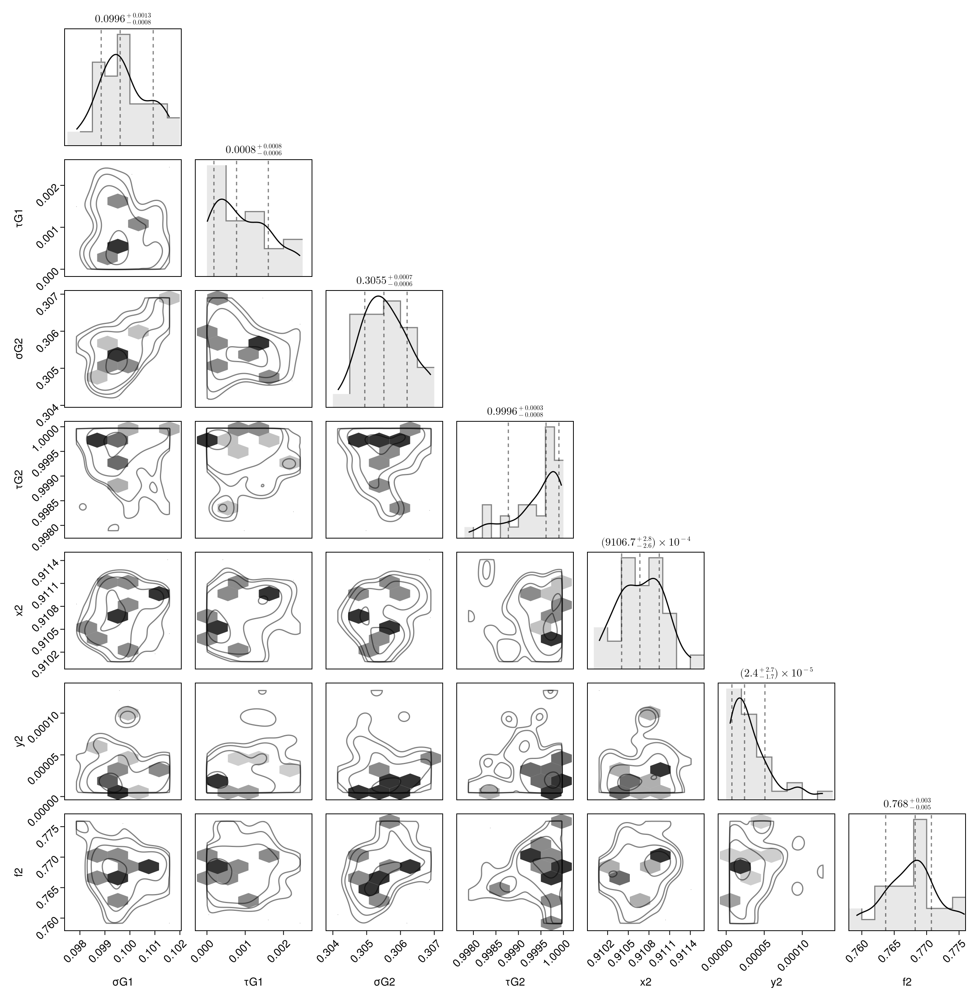

In [300]:
PairPlots.pairplot(Chains(pt), labels=Dict([Symbol("param_$i") => string(keys(prior)[i]) for i in 1:7]))

In [248]:
std(chain.sky.σG1)

2.447502763214378e-11

In [234]:
imgs = intensitymap.(skymodel.(Ref(post), sample(chain, 100)), Ref(g));

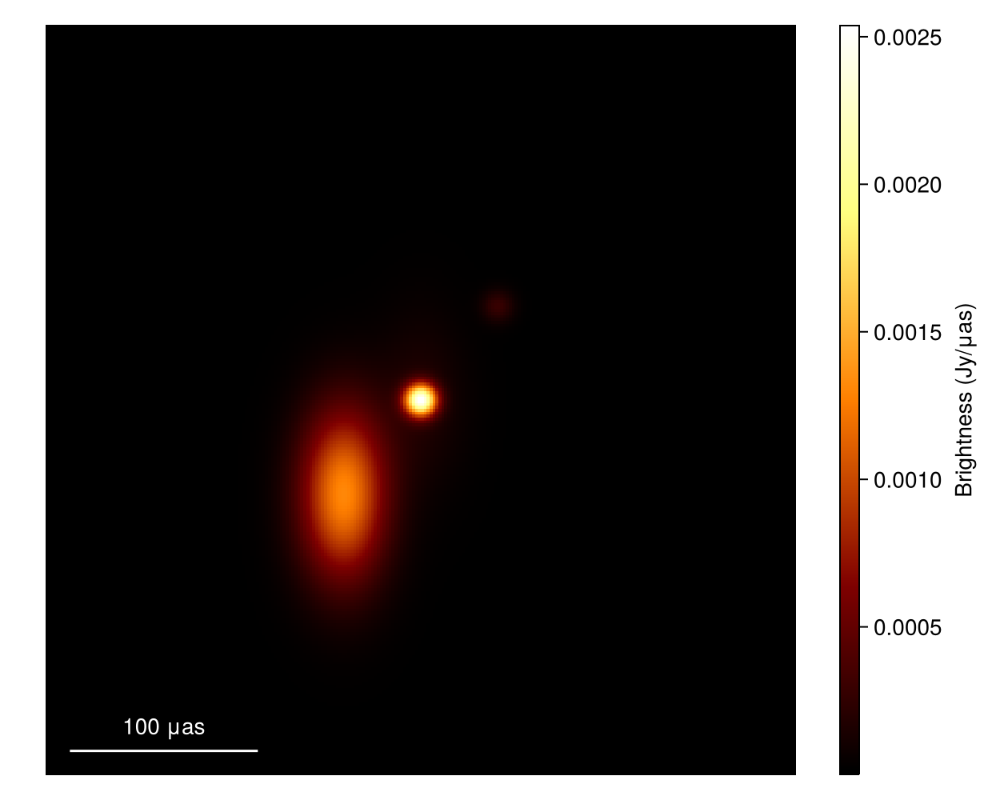

In [235]:
imageviz(mean(imgs), colormap=:afmhot)

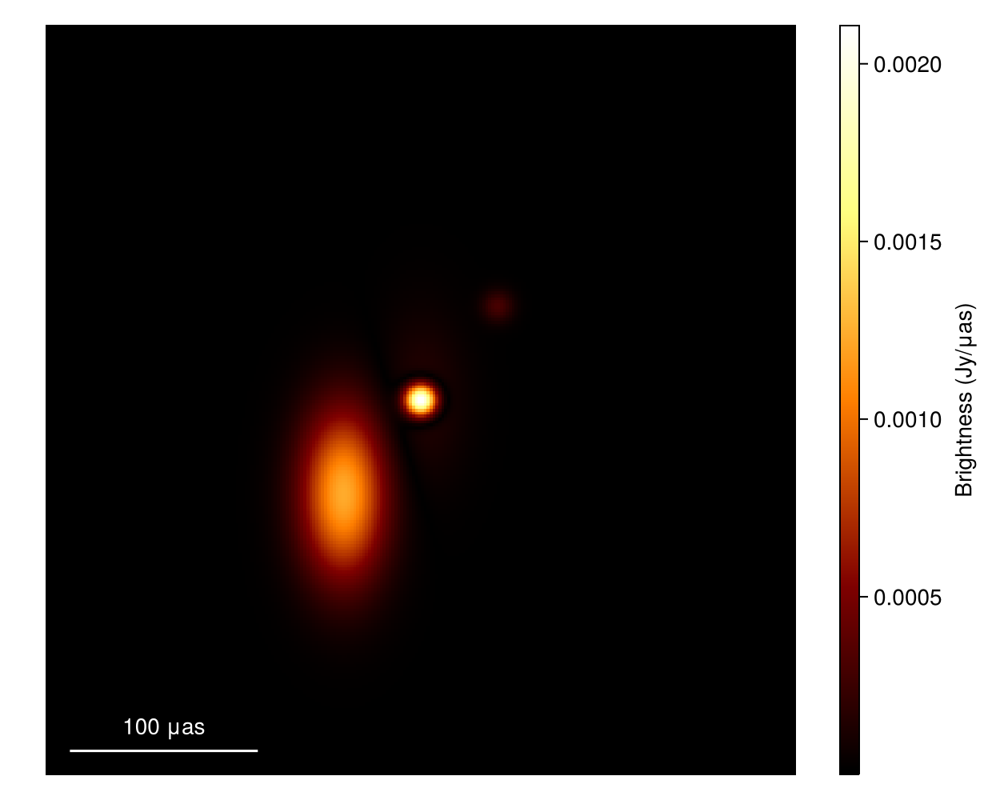

In [236]:
imageviz(std(imgs), colormap=:afmhot)